<a href="https://colab.research.google.com/github/GuiSSMartins/DTx-Project/blob/main/DTx_Project_Loja1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from graphviz import Digraph # para representação gráfica de grafos direcionados (utiliza linguagem dot)
import matplotlib.image as mpimg # operações relacionadas a imagens
import pandas as pd
import numpy as np
import gc #importing garbage collector
import time
import tensorflow as tf
from tensorflow.keras.models import Sequential
from sklearn.model_selection import GridSearchCV
from tensorflow.keras import layers, models
from itertools import product
from tensorflow.keras.layers import SimpleRNN, Dense, LSTM, Dropout
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_absolute_error, mean_squared_error
import math
import matplotlib.pyplot as plt
import keras
from keras import layers
from tensorflow import keras
from tensorflow.keras import layers, models
import tensorflow_probability as tfp

In [2]:
# função para reduzir a dimensão de um dataset
def reduce_mem_usage(df, verbose=True):
    numerics = ['int8','int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

### A análise exploratória dos dados e as suas coneções passam a ser feitas no KNIME!!!!!!

## Decomposição da Série Temporal

In [3]:
df_loja1_serie_temporal_agregada = pd.read_csv('loja1.csv')

import numpy as np
import tensorflow as tf

df_loja1_serie_temporal_agregada = reduce_mem_usage(df_loja1_serie_temporal_agregada)

n_periods = 1913

# eliminar as colunas indesejadas para a construção da série temporal
df_time_series = pd.DataFrame(data={"Vendas": df_loja1_serie_temporal_agregada['Vendas_do_dia'].tolist()}, index=df_loja1_serie_temporal_agregada['date'])

Mem. usage decreased to  0.05 Mb (63.8% reduction)


In [4]:
df_loja1_serie_temporal_agregada

,date,wm_yr_wk,wday,month,year,d,evento,Vendas_do_dia,week_group
0,2011-01-29,11101,1,1,2011,d_1,0,4337,0
1,2011-01-30,11101,2,1,2011,d_2,0,4155,0
2,2011-01-31,11101,3,1,2011,d_3,0,2816,1
3,2011-02-01,11101,4,2,2011,d_4,0,3051,1
4,2011-02-02,11101,5,2,2011,d_5,0,2630,1
...,...,...,...,...,...,...,...,...,...
1908,2016-04-20,11612,5,4,2016,d_1909,0,3722,1
1909,2016-04-21,11612,6,4,2016,d_1910,0,3709,1
1910,2016-04-22,11612,7,4,2016,d_1911,0,4387,1
1911,2016-04-23,11613,1,4,2016,d_1912,0,5577,0


## Carregar dados (agora concatenados)

In [13]:
df_loja1_RNN = reduce_mem_usage(df_loja1_serie_temporal_agregada)

Mem. usage decreased to  0.05 Mb (0.0% reduction)


# Treino de Modelos

##### Rede Neuronal Recurrente (RNN)

In [14]:
# Select specific input and output columns
# Assuming df_loja1_RNN is your DataFrame
selected_input_columns = df_loja1_RNN.iloc[:, [1, 2, 7, 8, 6]]  # Access columns using .iloc method
selected_output_column = df_loja1_RNN.iloc[:, 7]  # Access single column directly

from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

print(selected_output_column.values)

# Fit scaler to the data and transform it
selected_input_columns = scaler.fit_transform(selected_input_columns)
selected_output_column = scaler.fit_transform(selected_output_column.values.reshape(-1, 1))

import tensorflow as tf
from tensorflow.keras.preprocessing import timeseries_dataset_from_array

# Assuming selected_input_columns and selected_output_column are arrays or lists
input_data = selected_input_columns[:-7]
targets = selected_output_column[7:]

# Assuming both input_data and targets are arrays or lists
sequence_length = 7
sequences = [(input_data[i:i+sequence_length], targets[i+sequence_length]) for i in range(len(input_data) - sequence_length)]

# Extract input sequences and targets
input_sequences = [seq[0] for seq in sequences]
target_values = [seq[1] for seq in sequences]

# Convert lists to TensorFlow tensors
input_sequences_tensor = tf.constant(input_sequences, dtype=tf.float32)
target_values_tensor = tf.constant(target_values, dtype=tf.float32)

# Create a TensorFlow dataset from tensors
dataset = tf.data.Dataset.from_tensor_slices((input_sequences_tensor, target_values_tensor))

# .shuffle(buffer_size)
# Shuffle and batch your dataset
batch_size = 32
buffer_size = len(sequences)
dataset = dataset.batch(batch_size=batch_size, drop_remainder=True)

'''
for batch in dataset:
    inputs, target = batch
    # Now you can use inputs and target for training
    print(len(inputs))
'''

[4337 4155 2816 ... 4387 5577 6113]


'\nfor batch in dataset:\n    inputs, target = batch\n    # Now you can use inputs and target for training\n    print(len(inputs))\n'

In [15]:
# Assuming 'dataset' is your BatchObject and 'train_split_ratio' is the ratio of data you want in the training set
def split_BatchDataset(dataset, train_split_ratio=0.85):
    # Get the total number of elements in the dataset
    total_elements = sum(1 for _ in dataset)

    # Calculate the number of elements for the training set
    train_elements = int(total_elements * train_split_ratio)

    # Create a dataset with train_elements elements for the training set
    train_dataset = dataset.take(train_elements)

    # Create a dataset with the remaining elements for the validation set
    test_dataset = dataset.skip(train_elements)

    return train_dataset, test_dataset

# Example usage
train_dataset, test_dataset = split_BatchDataset(dataset)

In [16]:
# Inicializar listas para armazenar os dados
data_list = []
label_list = []

# Iterar sobre o conjunto de dados e extrair os dados e rótulos
for batch in train_dataset:
    data, label = batch  # Extrair os dados e rótulos da tupla
    data_list.append(data.numpy())  # Converter os dados para um array NumPy
    label_list.append(label.numpy())  # Converter os rótulos para um array NumPy

# Converter as listas de dados e rótulos para arrays NumPy
train_data_numpy = np.concatenate(data_list, axis=0)
train_labels_numpy = np.concatenate(label_list, axis=0)

In [17]:
# Assuming test_dataset is an instance of _SkipDataset
targets_test = []

# Iterate over the dataset to extract targets
for batch in test_dataset:
    inputs, target = batch  # Adjust this line according to the actual attribute/method name
    for value in target:
      targets_test.append(value)

targets_test = scaler.inverse_transform(targets_test)

print("Targets:", len(targets_test))

Targets: 288


In [22]:
hiperparameters = {
    'learning_rate': [0.1],
    #'neurons': [512],
    'neurons': [50, 256, 512],  # colocar para mostrar o tuning inicial
    'dense_neurons': [10],
    'activation': ['relu'],
    'dropout_rate': [0.1]
}

In [23]:
# Função para criar e treinar o modelo
#  input_shape=(7, 5),
def build_and_train_model(learning_rate, neurons, dense_neurons, activation, dropout_rate):
    model = models.Sequential()
    model.add(layers.LSTM(neurons, stateful=True, return_sequences=True, batch_input_shape=(32,7,5)))
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.LSTM(neurons, stateful=True, return_sequences=False))
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(dense_neurons, activation))
    model.add(layers.Dense(1))  # Output layer

    #optimizer = tf.optimizers.Adam(learning_rate)
    model.compile(optimizer='adam',
                  loss='mean_absolute_error',
                  metrics=[RootMeanSquaredError()])

    # early_stopping_callback,
    history = model.fit(train_data_numpy, train_labels_numpy, epochs=40, validation_split = 0.1, batch_size=batch_size, shuffle=False) #, callbacks = [callbacks])

    predictions = model.predict(test_dataset)
    #predictions = scaler.inverse_transform(predictions.reshape(-1, 1))

    mae = mean_absolute_error(scaler.transform(targets_test), predictions)
    mse = mean_squared_error(scaler.transform(targets_test), predictions)
    rmse = np.sqrt(mse)

    return [predictions, mae, mse, rmse, history, model, learning_rate, neurons, dense_neurons, activation, dropout_rate]
'''
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='ckpt/model_RNN_{epoch}_{val_loss:.3f}.hdf5', #path where to save the model
        save_best_only=True, #overwrite the current checkpoint if and only if
        monitor='val_loss', #the val_loss score has improved
        save_weights_only=True, #if True, only the weights are saved
        verbose=1, #verbosity mode
        period=5) # gravado callback por cada 5 epochs
]
'''

# Define the EarlyStopping callback
'''
early_stopping_callback = EarlyStopping(
    monitor='val_loss',    # Quantity to be monitored for improvement
    mini_delta = 0.1,
    # patience=5,            # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True   # Restores the model weights from the epoch with the best value of monitored quantity
)
'''
#early_stopping_callback = EarlyStopping(monitor='val_loss', patience=50, min_delta=0.1)

#model.fit(train_data_numpy, train_labels_numpy, epochs=1000, validation_split=0.2, batch_size=batch_size, shuffle=True)

"\nearly_stopping_callback = EarlyStopping(\n    monitor='val_loss',    # Quantity to be monitored for improvement\n    mini_delta = 0.1,\n    # patience=5,            # Number of epochs with no improvement after which training will be stopped\n    restore_best_weights=True   # Restores the model weights from the epoch with the best value of monitored quantity\n)\n"

In [24]:
best_RNN = [[], 0, 0, math.inf, None, None, 0, 0, 0, 0, 0];
all_tests_tuning = []

# Iterando sobre todas as combinações de hiperparâmetros
i = 1
for learning_rate, neurons, dense_neurons, activation, dropout_rate in product(*hiperparameters.values()):
    print(f"*** Teste nº {i} ***")
    i = i+1
    print(f"Treinando modelo com learning_rate={learning_rate}, num_neurons={neurons}, num_dense_neurons={dense_neurons}, funcao_de_ativacao={activation}, dropout_rate={dropout_rate}")
    [predictions, mae, mse, rmse, history, model, learning_rate, neurons, dense_neurons, activation, dropout_rate] = build_and_train_model(learning_rate, neurons, dense_neurons, activation, dropout_rate)
    print(f'MAE:{mae}, MSE:{mse} RMSE: {rmse}')

    if (best_RNN[3] > rmse):
      best_RNN = [predictions, mae, mse, rmse, history, model, learning_rate, neurons, dense_neurons, activation, dropout_rate]

    all_tests_tuning.append([predictions, mae, mse, rmse, history, model, learning_rate, neurons, dense_neurons, activation, dropout_rate])

*** Teste nº 1 ***
Treinando modelo com learning_rate=0.1, num_neurons=50, num_dense_neurons=10, funcao_de_ativacao=relu, dropout_rate=0.1
Epoch 1/40
45/45 [==============================] - 6s 44ms/step - loss: 0.7503 - root_mean_squared_error: 0.9530 - val_loss: 0.6896 - val_root_mean_squared_error: 0.8757
Epoch 2/40
45/45 [==============================] - 0s 10ms/step - loss: 0.5965 - root_mean_squared_error: 0.7635 - val_loss: 0.4804 - val_root_mean_squared_error: 0.6078
Epoch 3/40
45/45 [==============================] - 0s 9ms/step - loss: 0.5147 - root_mean_squared_error: 0.6661 - val_loss: 0.3913 - val_root_mean_squared_error: 0.5022
Epoch 4/40
45/45 [==============================] - 0s 7ms/step - loss: 0.5088 - root_mean_squared_error: 0.6478 - val_loss: 0.3508 - val_root_mean_squared_error: 0.4429
Epoch 5/40
45/45 [==============================] - 0s 6ms/step - loss: 0.4218 - root_mean_squared_error: 0.5484 - val_loss: 0.3300 - val_root_mean_squared_error: 0.4248
Epoch 6/4

In [25]:
best_RNN[5].summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (32, 7, 256)              268288    
                                                                 
 dropout_8 (Dropout)         (32, 7, 256)              0         
                                                                 
 lstm_9 (LSTM)               (32, 256)                 525312    
                                                                 
 dropout_9 (Dropout)         (32, 256)                 0         
                                                                 
 dense_8 (Dense)             (32, 10)                  2570      
                                                                 
 dense_9 (Dense)             (32, 1)                   11        
                                                                 
Total params: 796181 (3.04 MB)
Trainable params: 79618

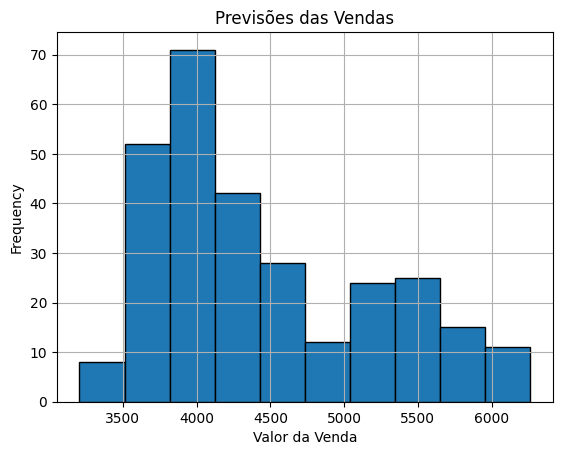

In [26]:
predictions = scaler.inverse_transform(best_RNN[0].reshape(-1,1))

# Flatten the array of arrays into a single list
flat_data = [item for sublist in predictions for item in sublist]

# Count the frequency of each item
unique_items, frequencies = np.unique(flat_data, return_counts=True)

# Assuming you have a list of data points called 'data'
plt.hist(predictions, bins='auto', edgecolor='black')  # 'auto' for automatic bin size determination
plt.xlabel('Valor da Venda')
plt.ylabel('Frequency')
plt.title('Previsões das Vendas')
plt.grid(True)  # Add grid lines
plt.show()

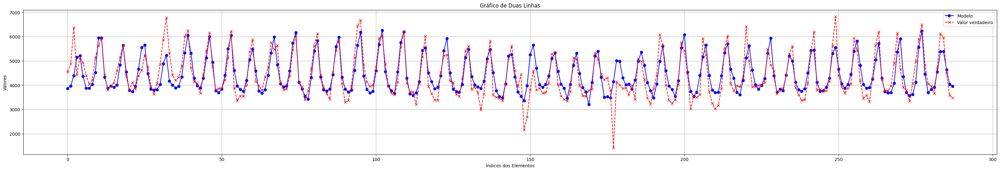

In [27]:
plt.figure(figsize=(40, 6))

# Criar o gráfico de linhas
plt.plot(predictions[:288], label='Modelo', color='blue', linestyle='-', marker='o')
plt.plot(targets_test[:288], label='Valor verdadeiro', color='red', linestyle='--', marker='x')

# Adicionar título e rótulos dos eixos
plt.title('Gráfico de Duas Linhas')
plt.xlabel('Índices dos Elementos')
plt.ylabel('Valores')

# Adicionar legenda
plt.legend()

# Exibir o gráfico
plt.grid(True)
plt.show()

In [28]:
mae = mean_absolute_error(targets_test, predictions)
mse = mean_squared_error(targets_test, predictions)
rmse = np.sqrt(mse)

In [29]:
mae, mse, rmse

(379.31381497281325, 256650.79997201855, 506.6071455990515)

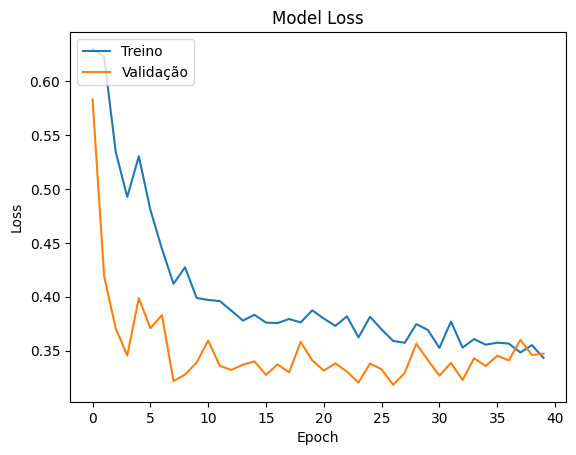

In [30]:
history_RNN = best_RNN[4]

# Gráfico evolução Loss
plt.plot(history_RNN.history['loss'])
plt.plot(history_RNN.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Treino', 'Validação'], loc='upper left')
plt.show()

## Deep Ensemble

In [31]:
num_models = 100

models_deep_ensemble = [None]*num_models

for i in range(num_models):
    model = models.Sequential()
    model.add(layers.LSTM(512, stateful=True, return_sequences=True, batch_input_shape=(32,7,5)))
    model.add(layers.Dropout(0.1))
    model.add(layers.LSTM(512, stateful=True, return_sequences=False))
    model.add(layers.Dropout(0.1))
    model.add(layers.Dense(10, activation='relu'))
    model.add(layers.Dense(1))  # Output layer

    #optimizer = tf.optimizers.Adam(learning_rate)
    model.compile(optimizer='adam',
                  loss='mean_absolute_error',
                  metrics=[RootMeanSquaredError()])

    # early_stopping_callback,
    history = model.fit(train_data_numpy, train_labels_numpy, epochs=40, validation_split = 0.1, batch_size=batch_size, shuffle=False)#, callbacks = [callbacks])

    predictions = model.predict(test_dataset)

    mae = mean_absolute_error(scaler.transform(targets_test), predictions)
    mse = mean_squared_error(scaler.transform(targets_test), predictions)
    rmse = np.sqrt(mse)

    predictions = scaler.inverse_transform(predictions.reshape(-1, 1))

    models_deep_ensemble[i] = [predictions, mae, mse, rmse, history, model]

A saída de streaming foi truncada nas últimas 5000 linhas.
45/45 [==============================] - 0s 9ms/step - loss: 0.4006 - root_mean_squared_error: 0.5205 - val_loss: 0.3488 - val_root_mean_squared_error: 0.4559
Epoch 13/40
45/45 [==============================] - 0s 9ms/step - loss: 0.4017 - root_mean_squared_error: 0.5245 - val_loss: 0.3387 - val_root_mean_squared_error: 0.4384
Epoch 14/40
45/45 [==============================] - 0s 8ms/step - loss: 0.3958 - root_mean_squared_error: 0.5141 - val_loss: 0.3546 - val_root_mean_squared_error: 0.4701
Epoch 15/40
45/45 [==============================] - 0s 8ms/step - loss: 0.3846 - root_mean_squared_error: 0.5041 - val_loss: 0.3661 - val_root_mean_squared_error: 0.4741
Epoch 16/40
45/45 [==============================] - 0s 9ms/step - loss: 0.3917 - root_mean_squared_error: 0.5117 - val_loss: 0.3534 - val_root_mean_squared_error: 0.4505
Epoch 17/40
45/45 [==============================] - 0s 8ms/step - loss: 0.3806 - root_mean_square

In [39]:
all_predictions_models = []

for i in range(num_models):
  all_predictions_models.append(models_deep_ensemble[i][0])

mean_preds = np.mean(all_predictions_models, axis=0)
median_preds = np.median(all_predictions_models, axis=0)

# Mediana Intervalo 95%
percentil_2_5 = np.concatenate(np.percentile(all_predictions_models, 2.5, axis=0))
percentil_97_5 = np.concatenate(np.percentile(all_predictions_models, 97.5, axis=0))
# Mediana Intervalo
percentil_16 = np.concatenate(np.percentile(all_predictions_models, 16, axis=0))
percentil_84 = np.concatenate(np.percentile(all_predictions_models, 84, axis=0))

var_preds = np.var(all_predictions_models, axis=0)
sd_preds = np.sqrt(var_preds)

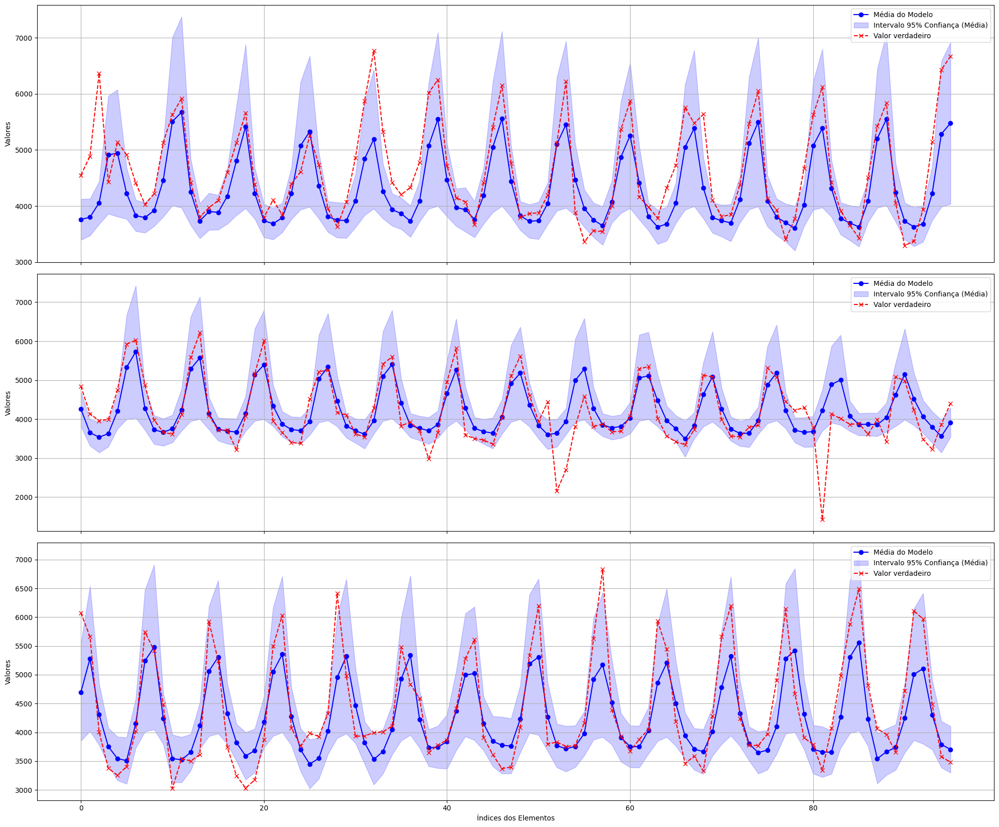

In [33]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 95% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [34]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Média): {coverage}')

Coverage (95% Média): 0.4655912422839506


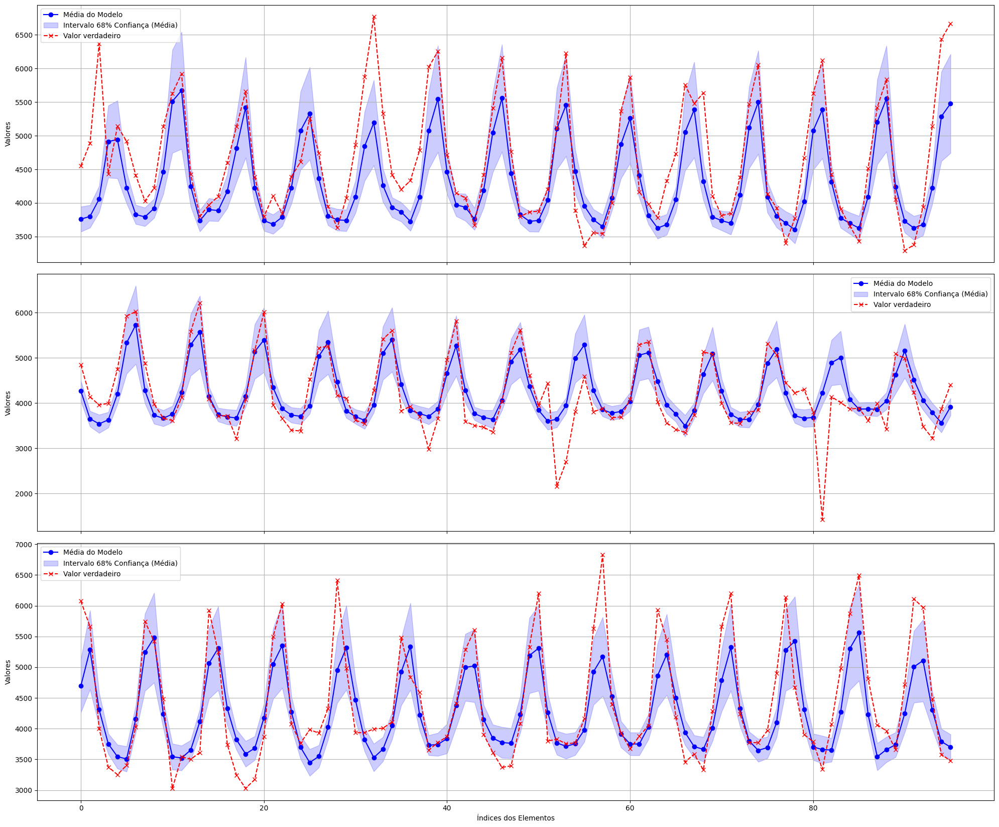

In [35]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 68% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [36]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Média): {coverage}')

Coverage (68% Média): 0.22685185185185186


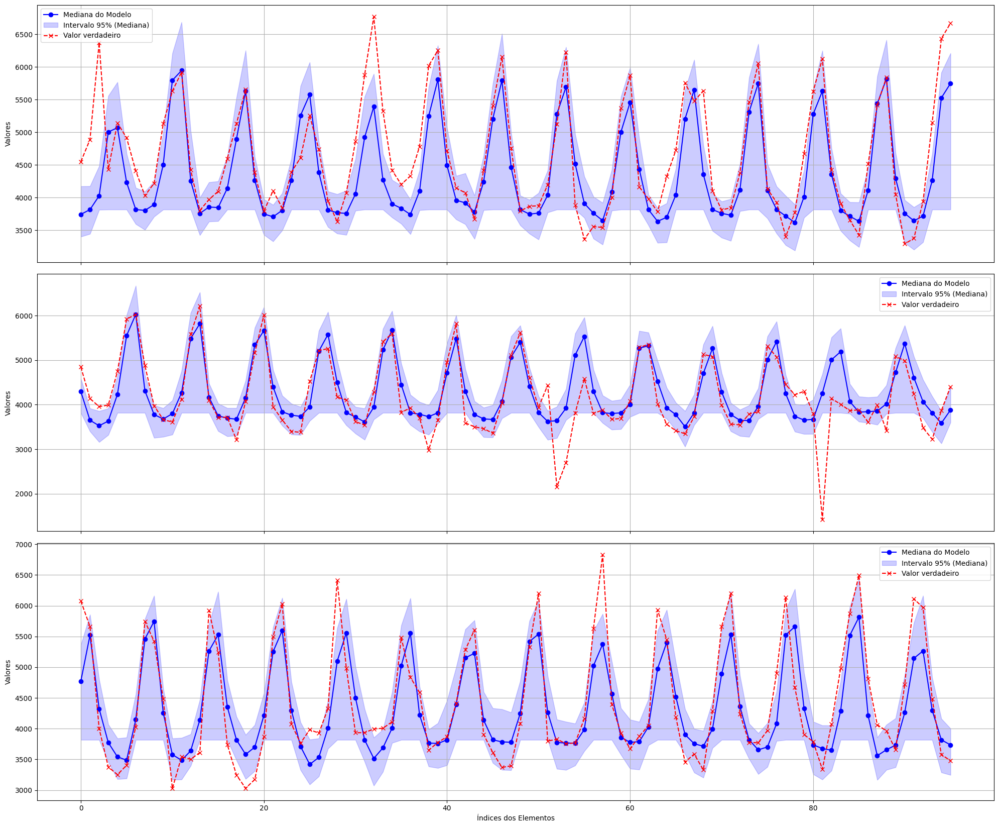

In [44]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_2_5[start:end], percentil_97_5[start:end], color='blue', alpha=0.2, label='Intervalo 95% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [45]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_2_5, targets_test <= percentil_97_5)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Mediana): {coverage}')

Coverage (95% Mediana): 0.44830246913580246


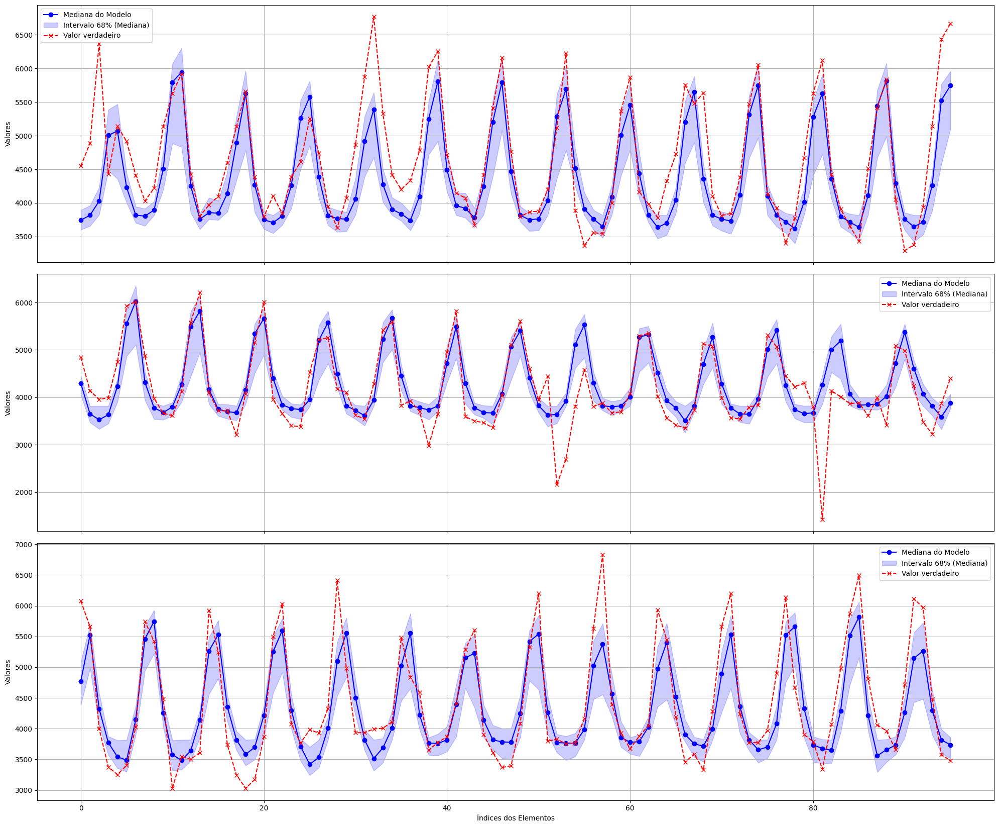

In [46]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_16[start:end], percentil_84[start:end], color='blue', alpha=0.2, label='Intervalo 68% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [47]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_16, targets_test <= percentil_84)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Mediana): {coverage}')

Coverage (68% Mediana): 0.21266155478395063


In [48]:
mae = mean_absolute_error(targets_test, predictions)
mse = mean_squared_error(targets_test, predictions)
rmse = np.sqrt(mse)

In [49]:
(mae,mse,rmse)

(440.1405539043633, 353157.5513041188, 594.2706044422177)

In [50]:
amplitude = np.mean(np.abs(targets_test - mean_preds))
print(f"Amplitude (Média): {amplitude}")
amplitude = np.mean(np.abs(targets_test - median_preds))
print(f"Amplitude (Mediana): {amplitude}")

Amplitude (Média): 394.57243872179777
Amplitude (Mediana): 370.2911453463362


## Monte-Carlo dropout

In [18]:
class TrainingDropout(Dropout):
  def call(self, inputs, training=None):
    return super().call(inputs, training=True)  # Force training to be True

In [19]:
hiperparameters = {
    'learning_rate': [0.1],
    'neurons': [512],
    'dense_neurons': [10],
    'activation': ['relu'],
    'dropout_rate': [0.1, 0.3, 0.5]
}

In [20]:
from sklearn.model_selection import GridSearchCV
import tensorflow as tf
from tensorflow.keras import layers, models
from itertools import product
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, LSTM, Dropout
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_absolute_error, mean_squared_error

def build_and_train_model(learning_rate, neurons, dense_neurons, activation, dropout_rate):

    model = models.Sequential()
    model.add(layers.LSTM(512, stateful=True, return_sequences=True, batch_input_shape=(32,7,5)))
    model.add(TrainingDropout(dropout_rate))
    #model.add(layers.Dropout(0.1))
    model.add(layers.LSTM(512, stateful=True, return_sequences=False))
    model.add(TrainingDropout(dropout_rate))
    #model.add(layers.Dropout(0.1))
    model.add(layers.Dense(10, activation='relu'))
    model.add(layers.Dense(1))  # Output layer

    #optimizer = tf.optimizers.Adam(learning_rate)
    model.compile(optimizer='adam',
                  loss='mean_absolute_error',
                  metrics=[RootMeanSquaredError()])

    history_MC = model.fit(train_data_numpy, train_labels_numpy, epochs=40, validation_split = 0.1, batch_size=batch_size, shuffle=False)

    predictions = model.predict(test_dataset)
    #predictions = scaler.inverse_transform(predictions.reshape(-1, 1))

    mae = mean_absolute_error(scaler.transform(targets_test), predictions)
    mse = mean_squared_error(scaler.transform(targets_test), predictions)
    rmse = np.sqrt(mse)

    return [predictions, mae, mse, rmse, history_MC, model, learning_rate, neurons, dense_neurons, activation, dropout_rate]

In [21]:
#best_MC = [[], 0, 0, math.inf, None, None, 0, 0, 0, 0, 0];
all_tests_tuning = []

# Iterando sobre todas as combinações de hiperparâmetros
i = 1
for learning_rate, neurons, dense_neurons, activation, dropout_rate in product(*hiperparameters.values()):
    print(f"*** Teste nº {i} ***")
    i = i+1
    print(f"Treinando modelo com learning_rate={learning_rate}, num_neurons={neurons}, num_dense_neurons={dense_neurons}, funcao_de_ativacao={activation}, dropout_rate={dropout_rate}")
    [predictions, mae, mse, rmse, history, model, learning_rate, neurons, dense_neurons, activation, dropout_rate] = build_and_train_model(learning_rate, neurons, dense_neurons, activation, dropout_rate)
    print(f'MAE:{mae}, MSE:{mse} RMSE: {rmse}')

    #if (best_MC[3] > rmse):
      #best_MC = [predictions, mae, mse, rmse, history, model, learning_rate, neurons, dense_neurons, activation, dropout_rate]

    all_tests_tuning.append([predictions, mae, mse, rmse, history, model, learning_rate, neurons, dense_neurons, activation, dropout_rate])

*** Teste nº 1 ***
Treinando modelo com learning_rate=0.1, num_neurons=512, num_dense_neurons=10, funcao_de_ativacao=relu, dropout_rate=0.1


Epoch 1/40
45/45 [==============================] - 16s 217ms/step - loss: 0.6273 - root_mean_squared_error: 0.7924 - val_loss: 0.3691 - val_root_mean_squared_error: 0.4668
Epoch 2/40
45/45 [==============================] - 8s 180ms/step - loss: 0.5462 - root_mean_squared_error: 0.6962 - val_loss: 0.4493 - val_root_mean_squared_error: 0.5728
Epoch 3/40
45/45 [==============================] - 8s 175ms/step - loss: 0.5585 - root_mean_squared_error: 0.7070 - val_loss: 0.5028 - val_root_mean_squared_error: 0.6626
Epoch 4/40
45/45 [==============================] - 8s 173ms/step - loss: 0.5385 - root_mean_squared_error: 0.6909 - val_loss: 0.3477 - val_root_mean_squared_error: 0.4600
Epoch 5/40
45/45 [==============================] - 8s 172ms/step - loss: 0.4622 - root_mean_squared_error: 0.5895 - val_loss: 0.3242 - val_root_mean_squared_error: 0.4170
Epoch 6/40
45/45 [==============================] - 8s 180ms/step - loss: 0.4591 - root_mean_squared_error: 0.5913 - val_loss: 0.3102 - val

#### MC Dropout (lr=0.1)

In [22]:
# Make predictions with Monte Carlo Dropout
def predict_with_mc_dropout(model, dataset, num_samples):
    preds = []

    for _ in range(num_samples):
        predictions = model.predict(dataset)
        preds.append(predictions)

    return preds

# Example usage: assuming you have a dataset called 'test_dataset' for testing
num_samples = 88
preds = predict_with_mc_dropout(all_tests_tuning[0][5], test_dataset, num_samples)
preds = [scaler.inverse_transform(preds[i].reshape(-1, 1)) for i in range(len(preds))]

9/9 [==============================] - 0s 38ms/step


In [23]:
[sublist[0] for sublist in preds]

[array([3721.5364], dtype=float32),
 array([3748.3943], dtype=float32),
 array([3729.541], dtype=float32),
 array([3718.067], dtype=float32),
 array([3772.0542], dtype=float32),
 array([3723.1277], dtype=float32),
 array([3733.6377], dtype=float32),
 array([3767.4563], dtype=float32),
 array([3762.6982], dtype=float32),
 array([3726.837], dtype=float32),
 array([3764.5854], dtype=float32),
 array([3746.9724], dtype=float32),
 array([3720.2913], dtype=float32),
 array([3702.239], dtype=float32),
 array([3746.7444], dtype=float32),
 array([3649.8674], dtype=float32),
 array([3729.9111], dtype=float32),
 array([3718.2817], dtype=float32),
 array([3728.457], dtype=float32),
 array([3691.095], dtype=float32),
 array([3764.8474], dtype=float32),
 array([3763.52], dtype=float32),
 array([3704.246], dtype=float32),
 array([3773.2266], dtype=float32),
 array([3707.6511], dtype=float32),
 array([3703.5828], dtype=float32),
 array([3749.6143], dtype=float32),
 array([3727.8533], dtype=float32),
 

In [24]:
mean_preds = np.mean(preds, axis=0)
median_preds = np.median(preds, axis=0)

# Mediana Intervalo 95%
percentil_2_5 = np.concatenate(np.percentile(preds, 2.5, axis=0))
percentil_97_5 = np.concatenate(np.percentile(preds, 97.5, axis=0))
# Mediana Intervalo
percentil_16 = np.concatenate(np.percentile(preds, 16, axis=0))
percentil_84 = np.concatenate(np.percentile(preds, 84, axis=0))

var_preds = np.var(preds, axis=0)
sd_preds = np.sqrt(var_preds)

In [25]:
len(mean_preds)

288

In [26]:
mae = mean_absolute_error(targets_test, mean_preds)
mse = mean_squared_error(targets_test, mean_preds)
rmse = np.sqrt(mse)

In [27]:
(mae, mse, rmse)

(374.8080617879716, 278288.8991757228, 527.530946178253)

In [28]:
amplitude = np.mean(np.abs(targets_test - mean_preds))
print(f"Amplitude (Média): {amplitude}")
amplitude = np.mean(np.abs(targets_test - median_preds))
print(f"Amplitude (Mediana): {amplitude}")

Amplitude (Média): 374.8080617879716
Amplitude (Mediana): 375.5263425602186


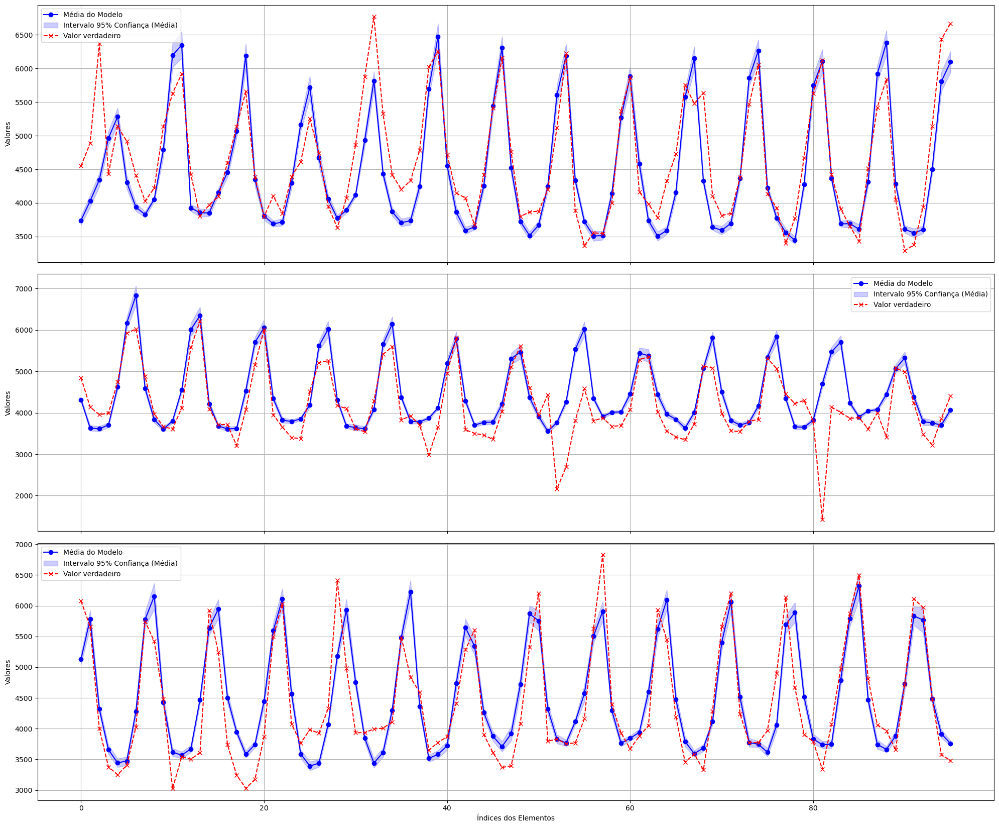

In [29]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 95% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [30]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Média): {coverage}')

Coverage (95% Média): 0.059088059413580245


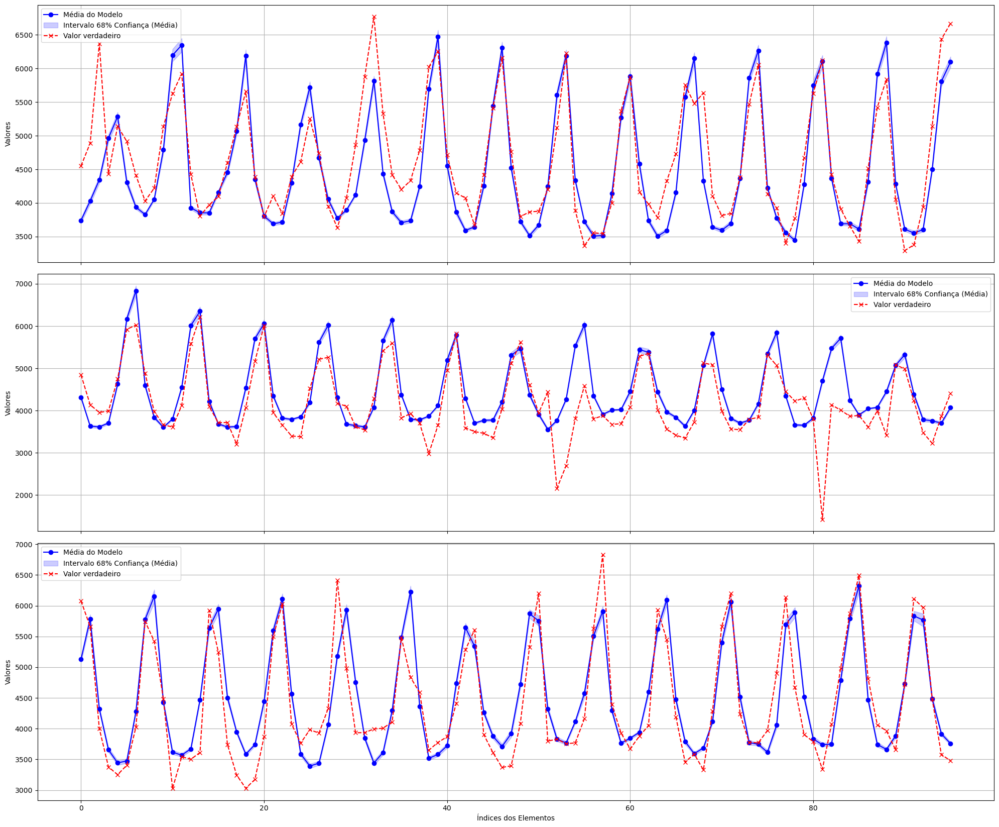

In [31]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 68% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [32]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Média): {coverage}')

Coverage (68% Média): 0.029333043981481483


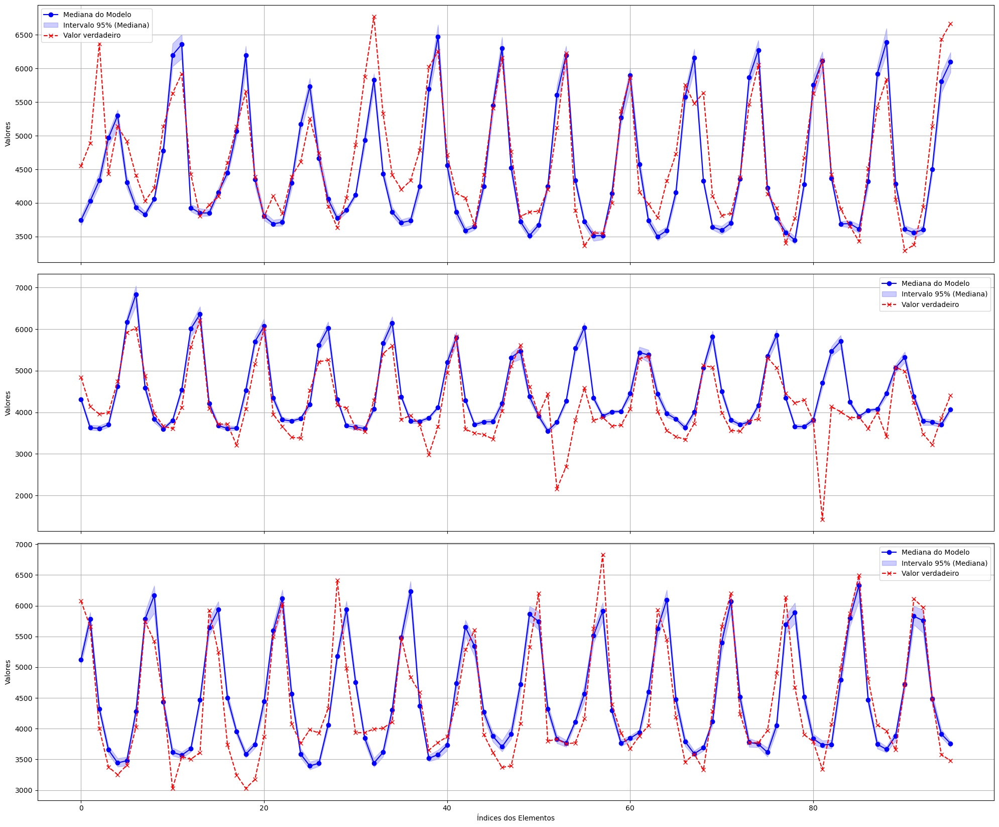

In [33]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]


    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_2_5[start:end], percentil_97_5[start:end], color='blue', alpha=0.2, label='Intervalo 95% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [34]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_2_5, targets_test <= percentil_97_5)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Mediana): {coverage}')

Coverage (95% Mediana): 0.05685763888888889


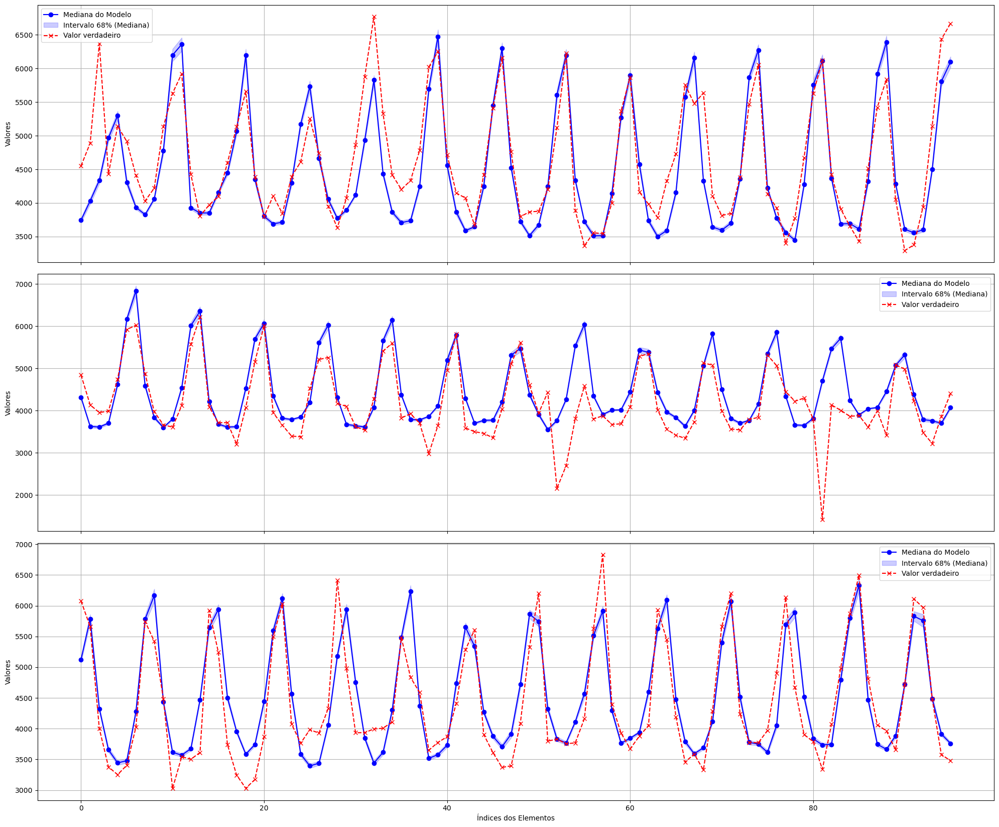

In [35]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([median + sd for median, sd in zip(median_interval, sd_interval)]).ravel()
    lower_bound = np.stack([median - sd for median, sd in zip(median_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 68% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [36]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_16, targets_test <= percentil_84)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Mediana): {coverage}')

Coverage (68% Mediana): 0.028718171296296297


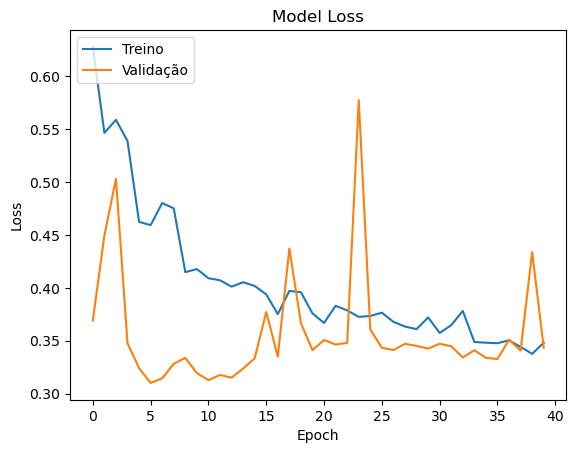

In [37]:
# Gráfico evolução Loss

history_MC = all_tests_tuning[0][4]

plt.plot(history_MC.history['loss'])
plt.plot(history_MC.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Treino', 'Validação'], loc='upper left')
plt.show()

#### MC Dropout (lr=0.3)

In [38]:
# Make predictions with Monte Carlo Dropout
def predict_with_mc_dropout(model, dataset, num_samples):
    preds = []

    for _ in range(num_samples):
        predictions = model.predict(dataset)
        preds.append(predictions)

    return preds

# Example usage: assuming you have a dataset called 'test_dataset' for testing
num_samples = 88
preds = predict_with_mc_dropout(all_tests_tuning[1][5], test_dataset, num_samples)
preds = [scaler.inverse_transform(preds[i].reshape(-1, 1)) for i in range(len(preds))]

9/9 [==============================] - 0s 38ms/step


In [39]:
[sublist[0] for sublist in preds]

[array([3537.2217], dtype=float32),
 array([3558.0352], dtype=float32),
 array([3577.7905], dtype=float32),
 array([3546.5808], dtype=float32),
 array([3652.7078], dtype=float32),
 array([3601.0032], dtype=float32),
 array([3522.8542], dtype=float32),
 array([3582.8137], dtype=float32),
 array([3597.7078], dtype=float32),
 array([3544.9392], dtype=float32),
 array([3504.328], dtype=float32),
 array([3617.474], dtype=float32),
 array([3668.4395], dtype=float32),
 array([3562.462], dtype=float32),
 array([3557.992], dtype=float32),
 array([3586.3425], dtype=float32),
 array([3569.967], dtype=float32),
 array([3544.7014], dtype=float32),
 array([3509.2021], dtype=float32),
 array([3501.965], dtype=float32),
 array([3575.3767], dtype=float32),
 array([3496.7832], dtype=float32),
 array([3577.7825], dtype=float32),
 array([3595.0867], dtype=float32),
 array([3494.6887], dtype=float32),
 array([3645.0654], dtype=float32),
 array([3632.2412], dtype=float32),
 array([3668.493], dtype=float32),

In [40]:
mean_preds = np.mean(preds, axis=0)
median_preds = np.median(preds, axis=0)

# Mediana Intervalo 95%
percentil_2_5 = np.concatenate(np.percentile(preds, 2.5, axis=0))
percentil_97_5 = np.concatenate(np.percentile(preds, 97.5, axis=0))
# Mediana Intervalo
percentil_16 = np.concatenate(np.percentile(preds, 16, axis=0))
percentil_84 = np.concatenate(np.percentile(preds, 84, axis=0))

var_preds = np.var(preds, axis=0)
sd_preds = np.sqrt(var_preds)

In [41]:
len(mean_preds)

288

In [42]:
mae = mean_absolute_error(targets_test, mean_preds)
mse = mean_squared_error(targets_test, mean_preds)
rmse = np.sqrt(mse)

In [43]:
(mae, mse, rmse)

(393.5879769078052, 295083.91952333035, 543.2162732497346)

In [44]:
amplitude = np.mean(np.abs(targets_test - mean_preds))
print(f"Amplitude (Média): {amplitude}")
amplitude = np.mean(np.abs(targets_test - median_preds))
print(f"Amplitude (Mediana): {amplitude}")

Amplitude (Média): 393.5879769078052
Amplitude (Mediana): 393.5148577219252


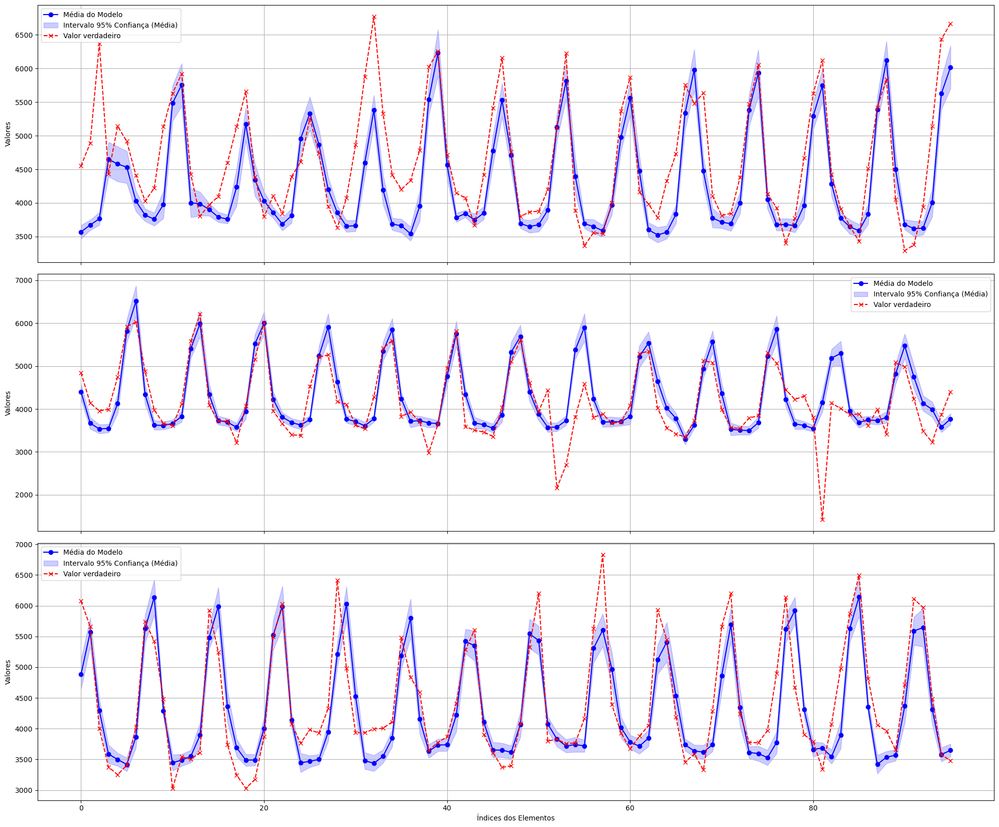

In [45]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 95% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [46]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Média): {coverage}')

Coverage (95% Média): 0.12330005787037036


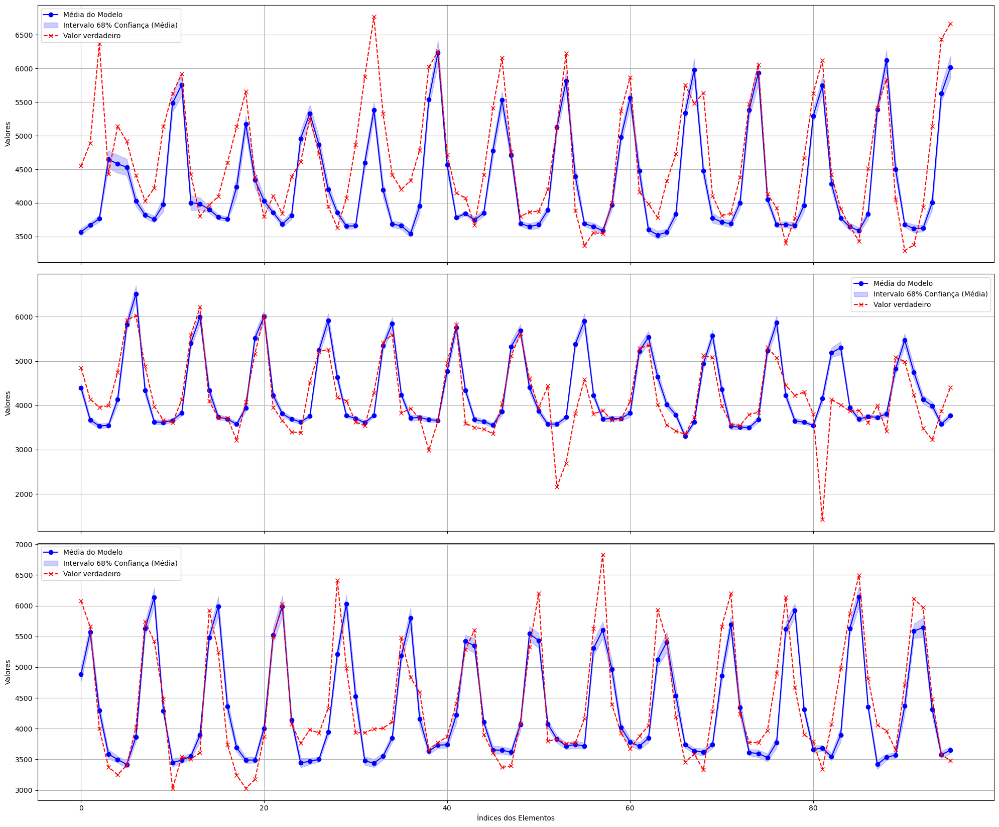

In [47]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 68% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [48]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Média): {coverage}')

Coverage (68% Média): 0.06368152006172839


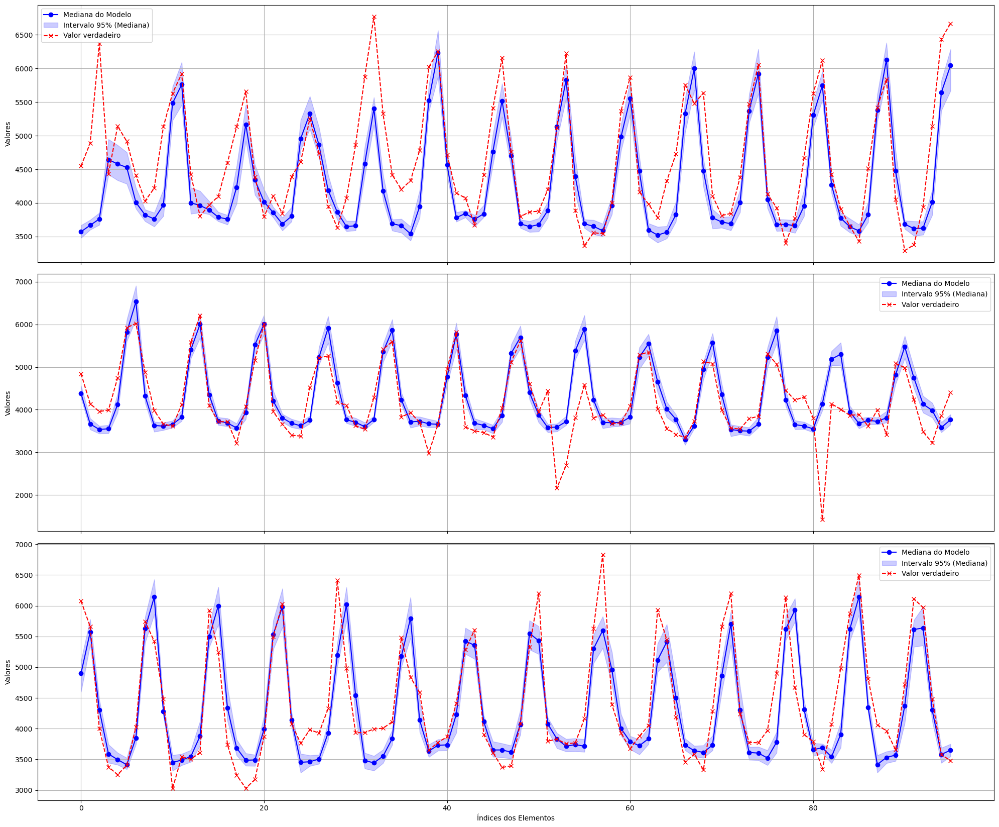

In [49]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_2_5[start:end], percentil_97_5[start:end], color='blue', alpha=0.2, label='Intervalo 95% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [50]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_2_5, targets_test <= percentil_97_5)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Mediana): {coverage}')

Coverage (95% Mediana): 0.11807966820987655


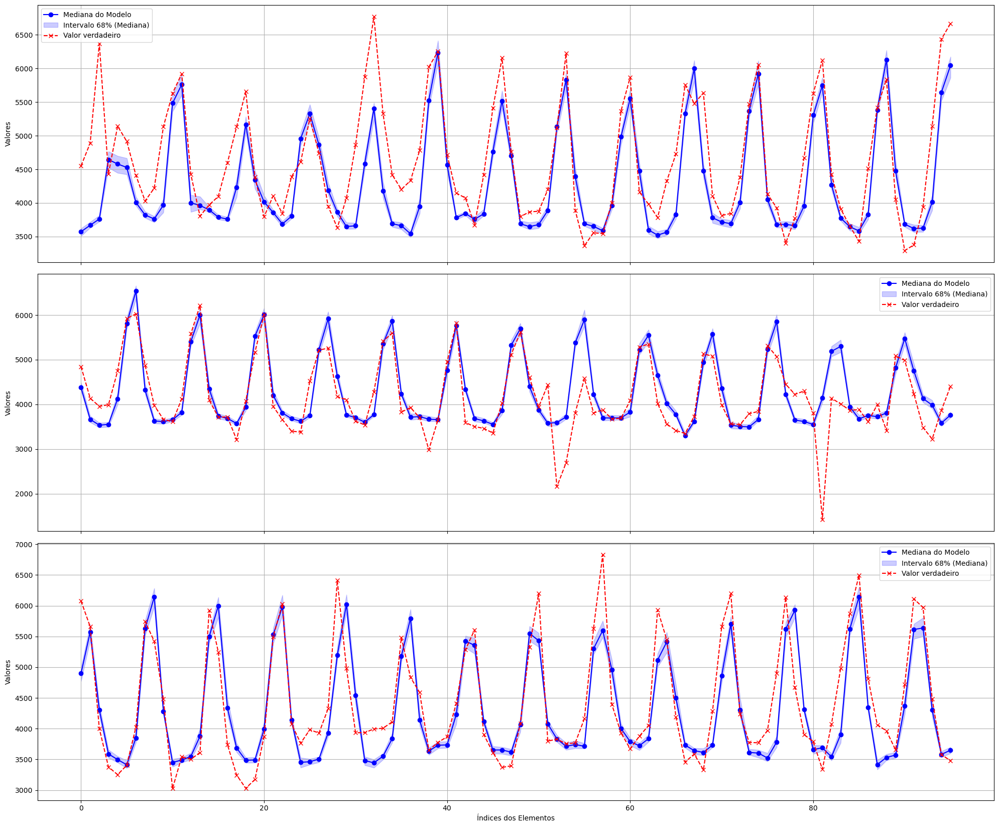

In [51]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_16[start:end], percentil_84[start:end], color='blue', alpha=0.2, label='Intervalo 68% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [52]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_16, targets_test <= percentil_84)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Mediana): {coverage}')

Coverage (68% Mediana): 0.06252411265432099


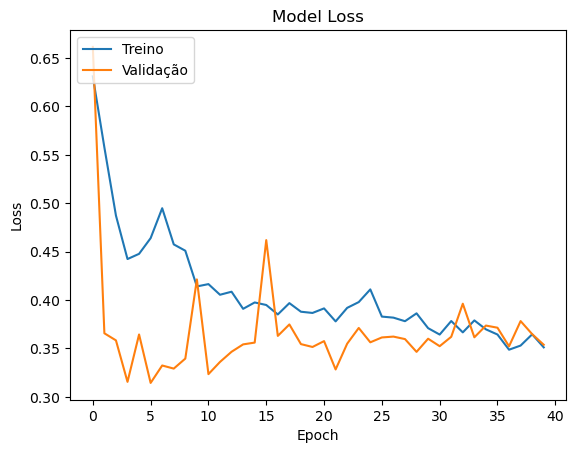

In [53]:
# Gráfico evolução Loss

history_MC = all_tests_tuning[1][4]

plt.plot(history_MC.history['loss'])
plt.plot(history_MC.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Treino', 'Validação'], loc='upper left')
plt.show()

#### MC Dropout (lr=0.5)

In [54]:
# Make predictions with Monte Carlo Dropout
def predict_with_mc_dropout(model, dataset, num_samples):
    preds = []

    for _ in range(num_samples):
        predictions = model.predict(dataset)
        preds.append(predictions)

    return preds

# Example usage: assuming you have a dataset called 'test_dataset' for testing
num_samples = 88
preds = predict_with_mc_dropout(all_tests_tuning[2][5], test_dataset, num_samples)
preds = [scaler.inverse_transform(preds[i].reshape(-1, 1)) for i in range(len(preds))]

1/9 [==>...........................] - ETA: 0s

9/9 [==============================] - 0s 47ms/step


In [55]:
[sublist[0] for sublist in preds]

[array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3848.285], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], dtype=float32),
 array([3849.735], d

In [56]:
mean_preds = np.mean(preds, axis=0)
median_preds = np.median(preds, axis=0)

# Mediana Intervalo 95%
percentil_2_5 = np.concatenate(np.percentile(preds, 2.5, axis=0))
percentil_97_5 = np.concatenate(np.percentile(preds, 97.5, axis=0))
# Mediana Intervalo
percentil_16 = np.concatenate(np.percentile(preds, 16, axis=0))
percentil_84 = np.concatenate(np.percentile(preds, 84, axis=0))

var_preds = np.var(preds, axis=0)
sd_preds = np.sqrt(var_preds)

In [57]:
len(mean_preds)

288

In [58]:
mae = mean_absolute_error(targets_test, mean_preds)
mse = mean_squared_error(targets_test, mean_preds)
rmse = np.sqrt(mse)

In [59]:
(mae, mse, rmse)

(768.2149811599994, 1151144.6326819977, 1072.9140844830017)

In [60]:
amplitude = np.mean(np.abs(targets_test - mean_preds))
print(f"Amplitude (Média): {amplitude}")
amplitude = np.mean(np.abs(targets_test - median_preds))
print(f"Amplitude (Mediana): {amplitude}")

Amplitude (Média): 768.2149811599994
Amplitude (Mediana): 768.2627335403705


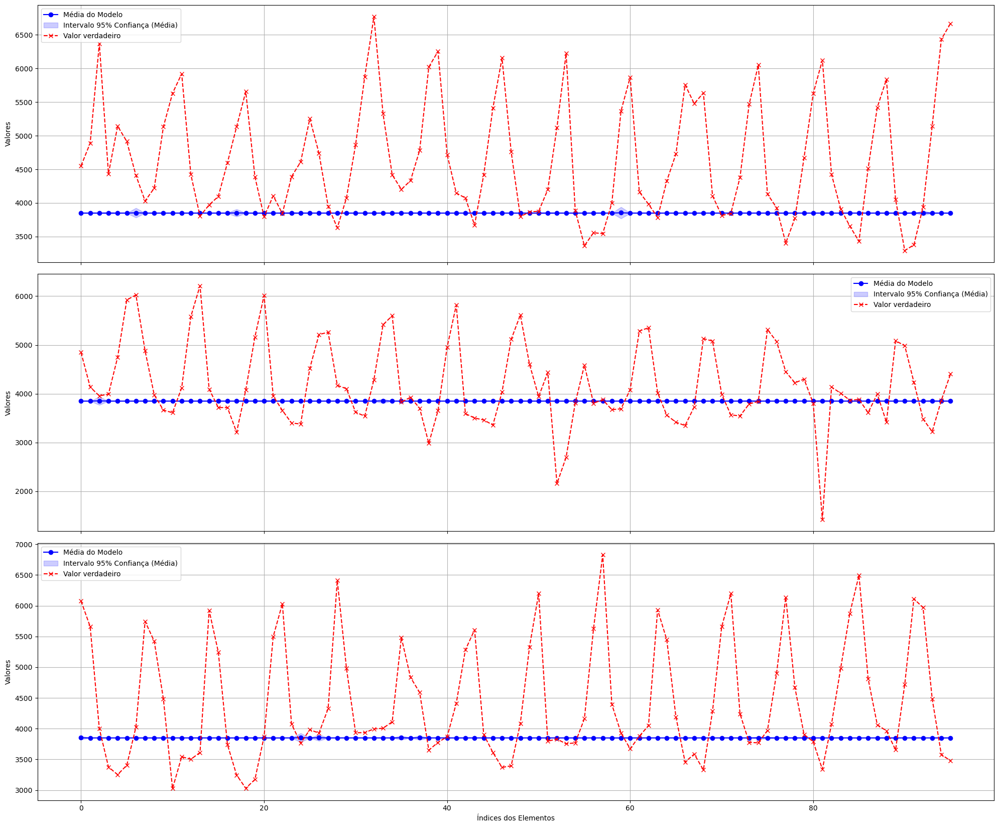

In [61]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 95% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [62]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Média): {coverage}')

Coverage (95% Média): 0.003918306327160494


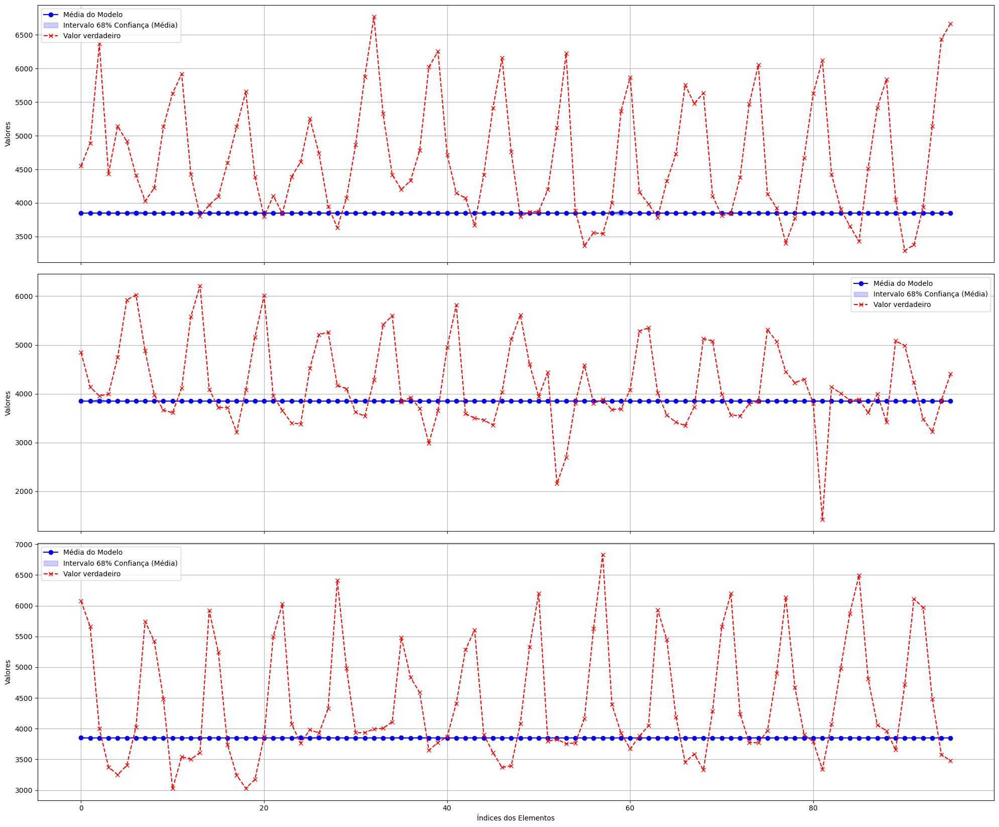

In [63]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 68% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [64]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Média): {coverage}')

Coverage (68% Média): 0.001736111111111111


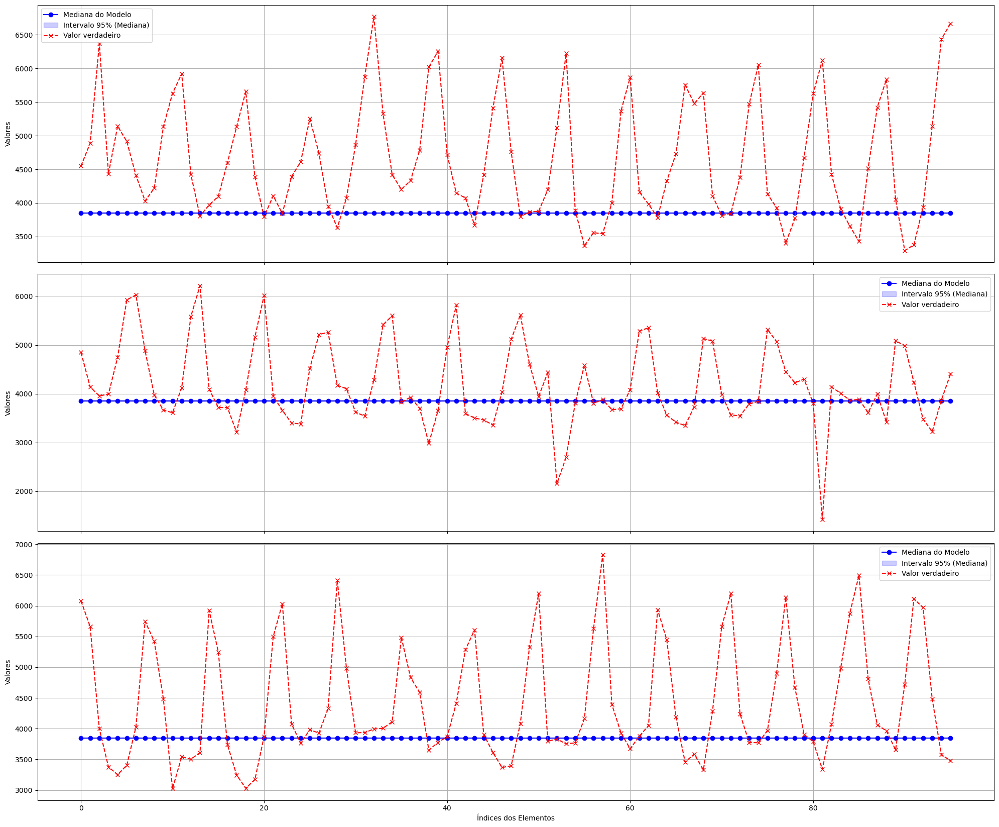

In [65]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_2_5[start:end], percentil_97_5[start:end], color='blue', alpha=0.2, label='Intervalo 95% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [66]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_2_5, targets_test <= percentil_97_5)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Mediana): {coverage}')

Coverage (95% Mediana): 9.645061728395061e-05


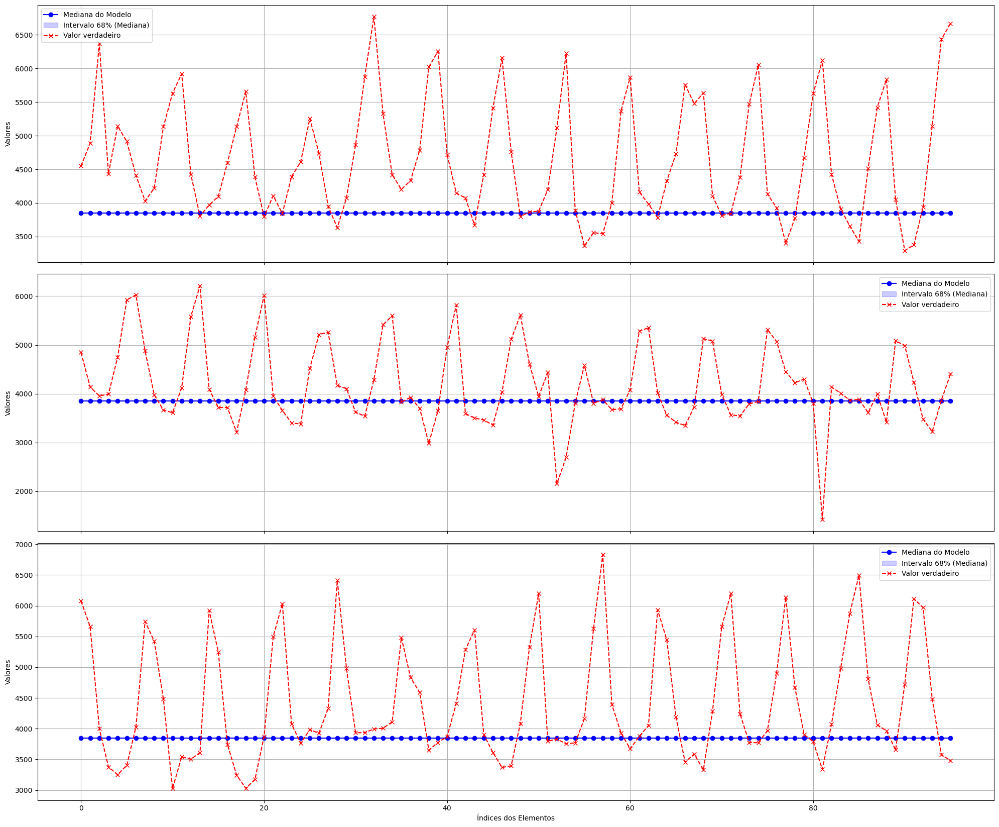

In [67]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_16[start:end], percentil_84[start:end], color='blue', alpha=0.2, label='Intervalo 68% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [68]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_16, targets_test <= percentil_84)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Mediana): {coverage}')

Coverage (68% Mediana): 0.0


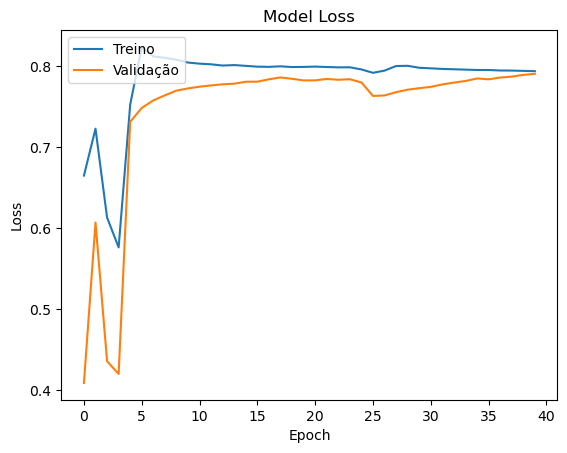

In [69]:
# Gráfico evolução Loss

history_MC = all_tests_tuning[2][4]

plt.plot(history_MC.history['loss'])
plt.plot(history_MC.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Treino', 'Validação'], loc='upper left')
plt.show()

## LSTM **Probabilistica**

In [70]:
hidden_units = [8,8]

def create_probablistic_lstm_model(input_shape, neurons, dropout_rate, dense_neurons, activation):
    model = models.Sequential()
    model.add(layers.LSTM(neurons, stateful=True, return_sequences=True, batch_input_shape=(32,7,5)))
    model.add(TrainingDropout(dropout_rate))
    model.add(layers.LSTM(neurons, stateful=True, return_sequences=False))
    model.add(TrainingDropout(dropout_rate))
    model.add(layers.Dense(dense_neurons, activation='relu'))

    # Criar saída probabilística (distribuição normal) e usar a camada Dense
    # para produzir os parâmetros da distribuição.
    # Configuramos units=2 para aprender tanto a média quanto a variância da distribuição normal.
    model.add(layers.Dense(units=2))
    model.add(tfp.layers.IndependentNormal(1))
    return model

In [71]:
#'''
def run_experiment(model, loss, train_data_numpy, train_labels_numpy, test_dataset, num_epochs, learning_rate):
    model.compile(
        optimizer=keras.optimizers.RMSprop(learning_rate=learning_rate),
        #optimizer='adam',
        loss=loss,
        metrics=['mae'],
    )

    print("Start training the model...")
    history = model.fit(train_data_numpy, train_labels_numpy, batch_size=32, epochs=num_epochs, validation_split=0.2, shuffle=False)
    print("Model training finished.")

    print("Evaluating model performance on training dataset...")
    train_loss, train_rmse = model.evaluate(train_data_numpy, train_labels_numpy, verbose=0)
    print(f"Train RMSE: {round(train_rmse, 3)}")

    print("Evaluating model performance on test dataset...")
    test_loss, test_rmse = model.evaluate(test_dataset, verbose=0)
    print(f"Test RMSE: {round(test_rmse, 3)}")

    return history

#'''
# Assuming train_data_numpy, train_labels_numpy, and test_dataset are defined elsewhere
input_shape = (32, 7, 5)  # Example shape, replace with actual shape
prob_bnn_model = create_probablistic_lstm_model(input_shape, 512, 0.1, 64, 'relu')


def negative_log_likelihood(y_true, distribution):
    return -tf.reduce_mean(distribution.log_prob(y_true))


num_epochs = 40
learning_rate = 0.001
loss_fn = tf.keras.losses.MeanSquaredError()

history_BNN = run_experiment(prob_bnn_model, negative_log_likelihood, train_data_numpy, train_labels_numpy, test_dataset, num_epochs, learning_rate)

Start training the model...
Epoch 1/40
40/40 [==============================] - 12s 189ms/step - loss: 1.4453 - mae: 1.0369 - val_loss: 1.0093 - val_mae: 0.6987
Epoch 2/40
40/40 [==============================] - 6s 154ms/step - loss: 0.9453 - mae: 0.7379 - val_loss: 1.1030 - val_mae: 0.7143
Epoch 3/40
40/40 [==============================] - 6s 159ms/step - loss: 0.9438 - mae: 0.7445 - val_loss: 2.4048 - val_mae: 0.6227
Epoch 4/40
40/40 [==============================] - 6s 163ms/step - loss: 0.9567 - mae: 0.6663 - val_loss: 0.9370 - val_mae: 0.6818
Epoch 5/40
40/40 [==============================] - 6s 162ms/step - loss: 0.8820 - mae: 0.6253 - val_loss: 1.2867 - val_mae: 0.7637
Epoch 6/40
40/40 [==============================] - 6s 154ms/step - loss: 0.8092 - mae: 0.6169 - val_loss: 1.2485 - val_mae: 0.6355
Epoch 7/40
40/40 [==============================] - 6s 153ms/step - loss: 0.7582 - mae: 0.5764 - val_loss: 0.9066 - val_mae: 0.5714
Epoch 8/40
40/40 [=============================

In [72]:
# Make predictions with Monte Carlo Dropout
def predict_with_bnn(model, dataset, num_samples):
    preds = []

    for _ in range(num_samples):
        predictions = model.predict(dataset)
        preds.append(predictions)

    return preds

# Example usage: assuming you have a dataset called 'test_dataset' for testing
num_samples = 88
preds = predict_with_bnn(prob_bnn_model, test_dataset, num_samples)
preds = [scaler.inverse_transform(preds[i].reshape(-1, 1)) for i in range(len(preds))]

mean_preds = np.mean(preds, axis=0)
median_preds = np.median(preds, axis=0)

# Mediana Intervalo 95%
percentil_2_5 = np.concatenate(np.percentile(preds, 2.5, axis=0))
percentil_97_5 = np.concatenate(np.percentile(preds, 97.5, axis=0))
# Mediana Intervalo
percentil_16 = np.concatenate(np.percentile(preds, 16, axis=0))
percentil_84 = np.concatenate(np.percentile(preds, 84, axis=0))

var_preds = np.var(preds, axis=0)
sd_preds = np.sqrt(var_preds)

9/9 [==============================] - 0s 43ms/step


In [73]:
mae = mean_absolute_error(targets_test, mean_preds)
mse = mean_squared_error(targets_test, mean_preds)
rmse = np.sqrt(mse)

In [74]:
(mae, mse, rmse)

(537.8136388470523, 475235.3446474983, 689.3731534136634)

In [75]:
amplitude = np.mean(np.abs(targets_test - mean_preds))
print(f"Amplitude (Média): {amplitude}")
amplitude = np.mean(np.abs(targets_test - median_preds))
print(f"Amplitude (Mediana): {amplitude}")

Amplitude (Média): 537.8136388470523
Amplitude (Mediana): 538.742952549024


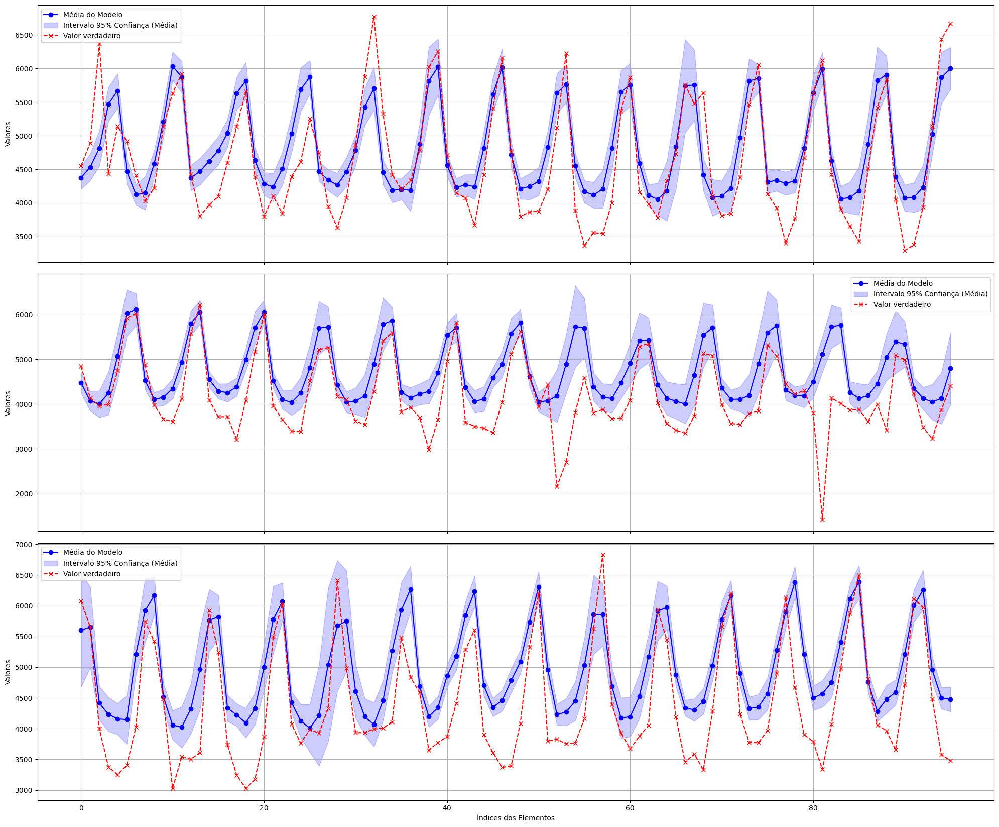

In [76]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 95% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [77]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - 1.96*sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Média): {coverage}')

Coverage (95% Média): 0.17874710648148148


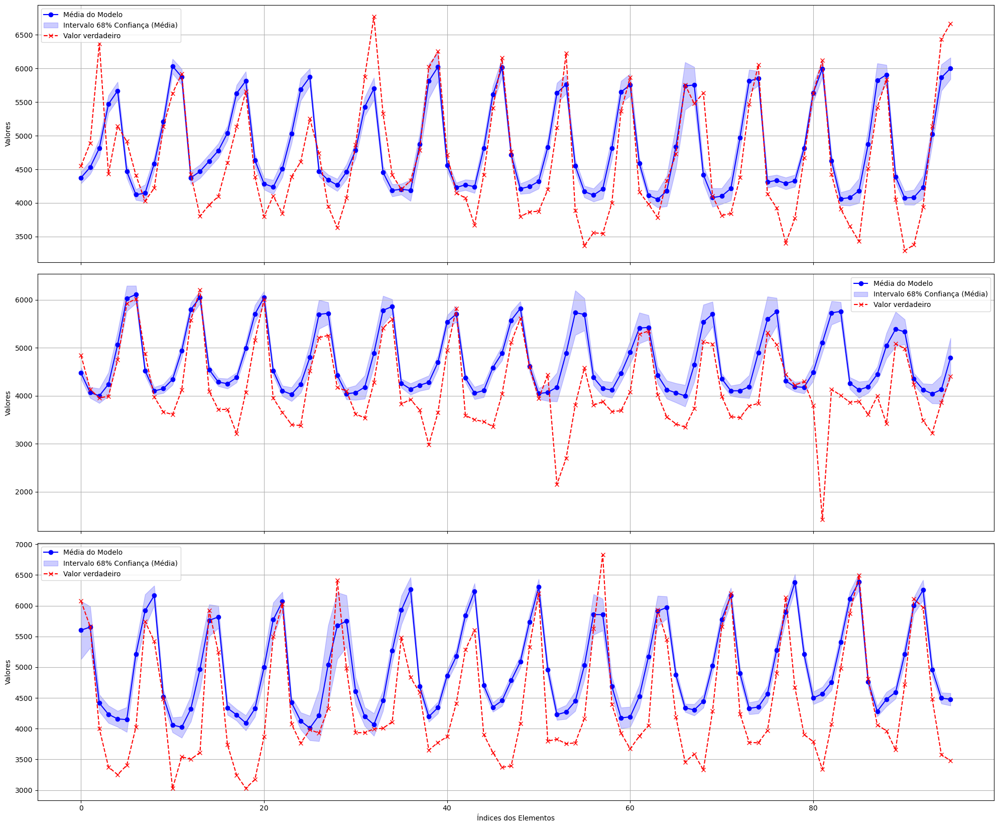

In [78]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    mean_interval = mean_preds[start:end]
    sd_interval = sd_preds[start:end]
    targets_interval = targets_test[start:end]

    # Realizar a adição e subtração elemento a elemento
    upper_bound = np.stack([mean + sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()
    lower_bound = np.stack([mean - sd for mean, sd in zip(mean_interval, sd_interval)]).ravel()

    # Criar o gráfico de linhas
    ax.plot(range(96), mean_interval, label='Média do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), lower_bound, upper_bound, color='blue', alpha=0.2, label='Intervalo 68% Confiança (Média)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [79]:
# Calcular os limites superiores e inferiores
upper_bound = np.stack([mean + sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()
lower_bound = np.stack([mean - sd for mean, sd in zip(mean_preds, sd_preds)]).ravel()

# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= lower_bound, targets_test <= upper_bound)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Média): {coverage}')

Coverage (68% Média): 0.09071180555555555


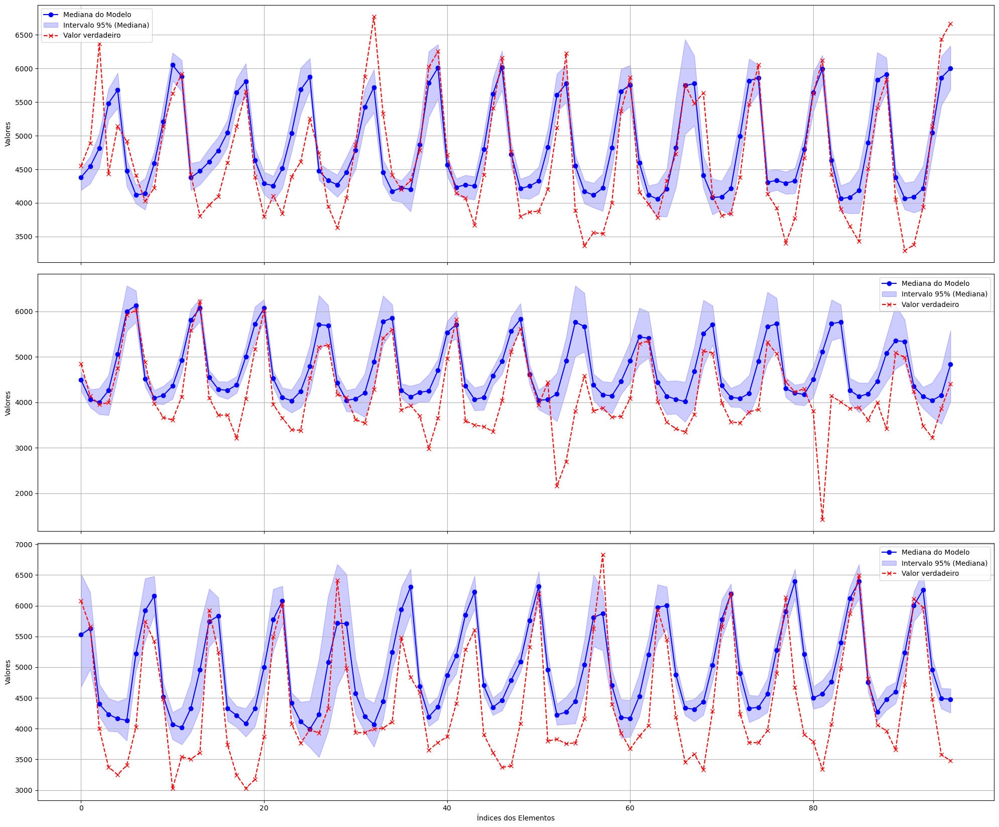

In [80]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_2_5[start:end], percentil_97_5[start:end], color='blue', alpha=0.2, label='Intervalo 95% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [81]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_2_5, targets_test <= percentil_97_5)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (95% Mediana): {coverage}')

Coverage (95% Mediana): 0.17350260416666666


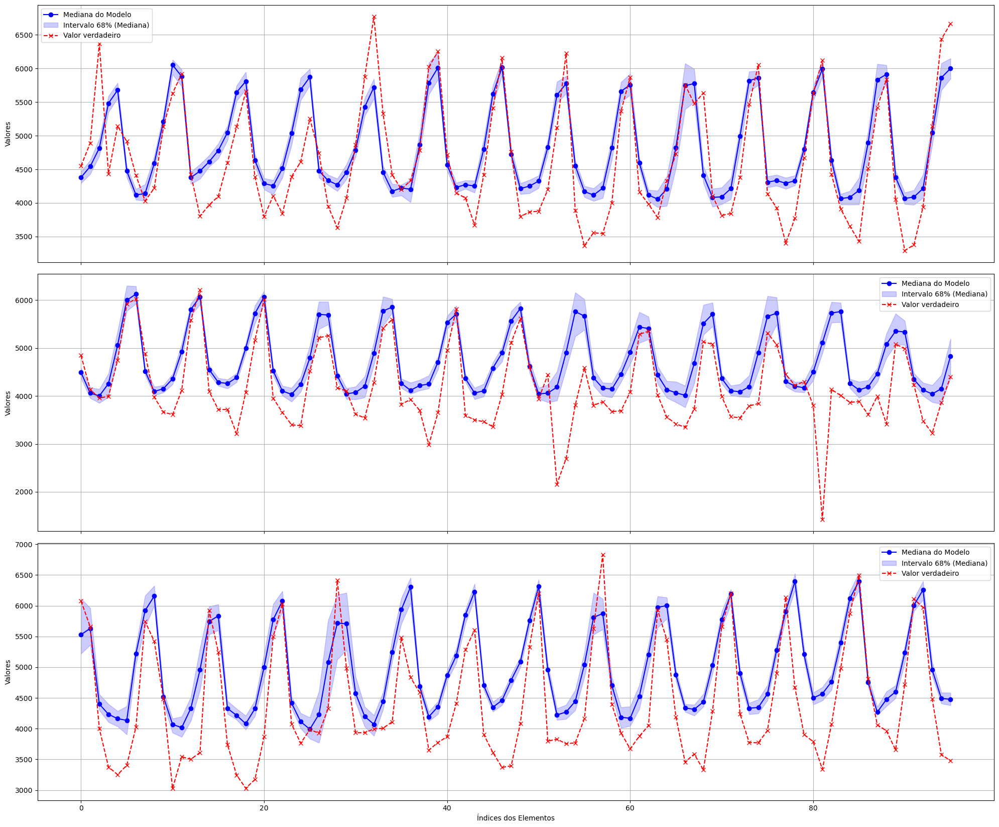

In [82]:
# Criar uma figura e três subplots
fig, axes = plt.subplots(3, 1, figsize=(20, 18), sharex=True)

# Função para plotar o gráfico em um subplot específico
def plot_interval(ax, start, end, interval_index):
    # Definir os dados do intervalo
    median_interval = median_preds[start:end]
    targets_interval = targets_test[start:end]

    # Criar o gráfico de linhas
    ax.plot(range(96), median_interval, label='Mediana do Modelo', color='blue', linestyle='-', marker='o')
    ax.fill_between(range(96), percentil_16[start:end], percentil_84[start:end], color='blue', alpha=0.2, label='Intervalo 68% (Mediana)')
    ax.plot(range(96), targets_interval, label='Valor verdadeiro', color='red', linestyle='--', marker='x')

    # Adicionar legenda
    ax.legend()

    # Adicionar grade
    ax.grid(True)

# Plotar os três intervalos de dados
plot_interval(axes[0], 0, 96, 1)
plot_interval(axes[1], 96, 192, 2)
plot_interval(axes[2], 192, 288, 3)

# Adicionar título geral e rótulos dos eixos
#fig.suptitle('Gráfico de Linhas Dividido em Três Partes')
axes[-1].set_xlabel('Índices dos Elementos')
for ax in axes:
    ax.set_ylabel('Valores')

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Exibir o gráfico
plt.show()

In [83]:
# Verificar se os valores reais estão dentro dos intervalos de confiança
within_interval = np.logical_and(targets_test >= percentil_16, targets_test <= percentil_84)

# Calcular a cobertura
coverage = np.mean(within_interval)

print(f'Coverage (68% Mediana): {coverage}')

Coverage (68% Mediana): 0.08799913194444445


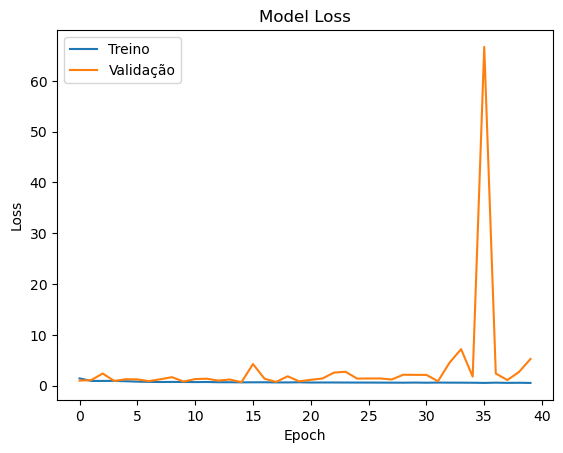

In [84]:
# Gráfico evolução Loss
plt.plot(history_BNN.history['loss'])
plt.plot(history_BNN.history['val_loss'])
plt.title('Model Loss')
#plt.ylim(0, 1)  # Intervalo de 0 a 15
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Treino', 'Validação'], loc='upper left')
plt.show()

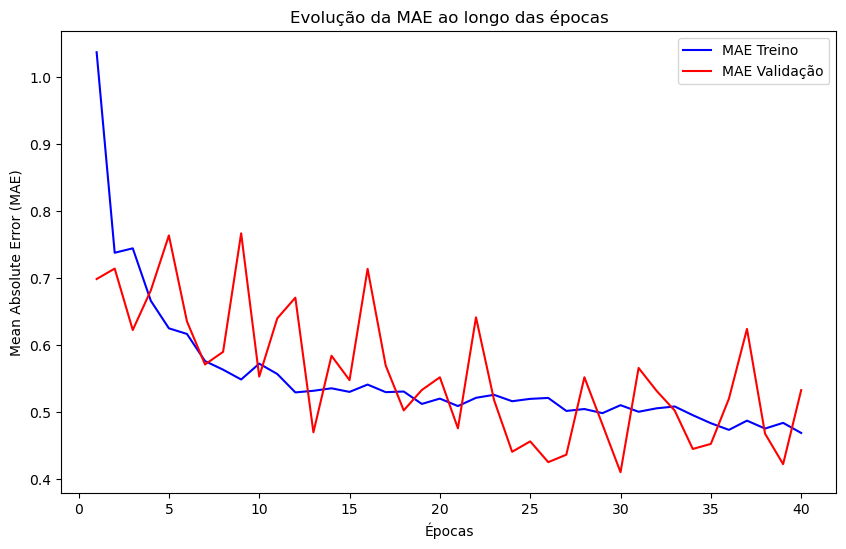

In [85]:
# Extrair os dados de MAE do histórico
mae_train = history_BNN.history['mae']
mae_val = history_BNN.history['val_mae']
epochs = range(1, len(mae_train) + 1)

# Plotar os dados
plt.figure(figsize=(10, 6))
plt.plot(epochs, mae_train, 'b', label='MAE Treino')
plt.plot(epochs, mae_val, 'r', label='MAE Validação')
plt.title('Evolução da MAE ao longo das épocas')
plt.xlabel('Épocas')
plt.ylabel('Mean Absolute Error (MAE)')
plt.legend()
plt.show()

### Análises dos dados

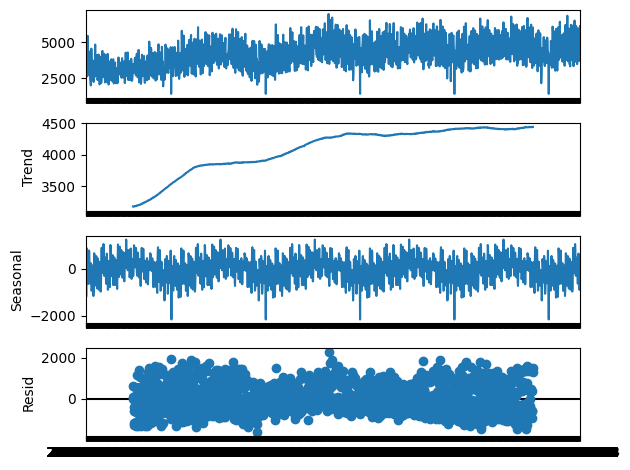

In [119]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(df_time_series, model='additive', period=365)
decomposition.plot()
plt.show()

In [120]:
# Represenção do digrafo, aplicando cores e percentagens nas arrestas
dot = Digraph(comment='Grafo para descrever a Estrutura do Dados')

dot.node('A', f'Total de estados', color='lightblue2', style='filled')
dot.node('B', f'Estado CA', color='lightblue2', style='filled')
dot.node('C', f'Estado TX', color='lightblue2', style='filled')
dot.node('D', f'Estado W', color='lightblue2', style='filled')
dot.node('E', f'LOJA 1', color='lightblue2', style='filled')
dot.node('F', f'LOJA 2', color='lightblue2', style='filled')
dot.node('G', f'LOJA 3', color='lightblue2', style='filled')
dot.node('H', f'LOJA 4', color='lightblue2', style='filled')
dot.node('I', f'LOJA 1', color='lightblue2', style='filled')
dot.node('J', f'LOJA 2', color='lightblue2', style='filled')
dot.node('K', f'LOJA 3', color='lightblue2', style='filled')
dot.node('L', f'LOJA 1', color='lightblue2', style='filled')
dot.node('M', f'LOJA 2', color='lightblue2', style='filled')
dot.node('N', f'LOJA 3', color='lightblue2', style='filled')
dot.node('JA', f'CATEGORY HOBBIES', color='lightblue2', style='filled')
dot.node('JB', f'CATEGORY FOOD', color='lightblue2', style='filled')
dot.node('JC', f'CATEGORY HOUSEHOLD', color='lightblue2', style='filled')
dot.node('JAA', f'DEPARTAMENT HOBBIES 1', color='lightblue2', style='filled')
dot.node('JAB', f'DEPARTAMENT HOBBIES 2', color='lightblue2', style='filled')
dot.node('JBA', f'DEPARTAMENT FOOD 1', color='lightblue2', style='filled')
dot.node('JBB', f'DEPARTAMENT FOOD 2', color='lightblue2', style='filled')
dot.node('JBC', f'DEPARTAMENT FOOD 3', color='lightblue2', style='filled')
dot.node('JCA', f'DEPARTAMENT HOUSEHOLD 1', color='lightblue2', style='filled')
dot.node('JCB', f'DEPARTAMENT HOUSEHOLD 2', color='lightblue2', style='filled')


dot.edge('A', 'B')
dot.edge('A', 'C')
dot.edge('A', 'D')
dot.edge('B', 'E')
dot.edge('B', 'F')
dot.edge('B', 'G')
dot.edge('B', 'H')
dot.edge('C', 'I')
dot.edge('C', 'J')
dot.edge('C', 'K')
dot.edge('D', 'L')
dot.edge('D', 'M')
dot.edge('D', 'N')
dot.edge('J', 'JA')
dot.edge('J', 'JB')
dot.edge('J', 'JC')
dot.edge('JA', 'JAA')
dot.edge('JA', 'JAB')
dot.edge('JB', 'JBA')
dot.edge('JB', 'JBB')
dot.edge('JB', 'JBC')
dot.edge('JC', 'JCA')
dot.edge('JC', 'JCB')

dot.render('/content/drive/MyDrive/Save/patient_dot', format='png', cleanup=True)

'/content/drive/MyDrive/Save/patient_dot.png'

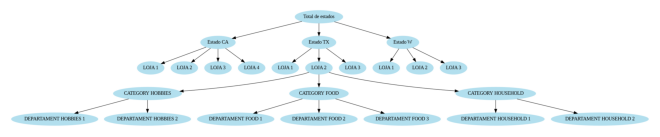

In [121]:
image = mpimg.imread('/content/drive/MyDrive/Save/patient_dot.png')

fig, ax = plt.subplots() #criar uma subparcela única
ax.imshow(image) #exibir a imagem na subparcela e desativar os eixos
ax.axis('off')
#centralizar a imagem na subparcela
ax.set_position([0, 0, 1, 1])  # Define a posição da subparcela para cobrir toda a figura
#fig.savefig("/content/drive/MyDrive/Save/patient_dot.png")
plt.show() #pode nem ser colocado